In [4]:
import warnings
warnings.filterwarnings("ignore", category = FutureWarning)

import os
import keras
import h5py
import librosa
import itertools
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict

from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from keras.models import Sequential
from keras.layers import Dense, Reshape
from keras.layers import Activation
from keras.layers import Conv2D, ELU
from keras.layers import MaxPooling2D, ZeroPadding2D
from keras.layers import Dropout
from keras.layers import Flatten
from keras.layers import BatchNormalization
from keras.layers import GRU

# Read the data

> Helper functions to assist the process to read songs, split then and return an array of spectrograms/melspectrograms

In [19]:
"""
@description: Method to split a song into multiple songs using overlapping windows
"""
def splitsongs(X, y, window = 0.1, overlap = 0.5):
    # Empty lists to hold our results
    temp_X = []
    temp_y = []

    # Get the input song array size
    xshape = X.shape[0]
    chunk = int(xshape*window)
    offset = int(chunk*(1.-overlap))
    
    # Split the song and create new ones on windows
    spsong = [X[i:i+chunk] for i in range(0, xshape - chunk + offset, offset)]
    for s in spsong:
        temp_X.append(s)
        temp_y.append(y)

    return np.array(temp_X), np.array(temp_y)

In [20]:
"""
@description: Method to convert a list of songs to a np array of melspectrograms
"""
def to_melspectrogram(songs, n_fft = 1024, hop_length = 512):
    # Transformation function
    melspec = lambda x: librosa.feature.melspectrogram(x, n_fft = n_fft,
        hop_length = hop_length)[:,:,np.newaxis]

    # map transformation of input songs to melspectrogram using log-scale
    tsongs = map(melspec, songs)
    return np.array(list(tsongs))

In [5]:
def read_data(src_dir, genres, song_samples, spec_format, debug = True):    
    # Empty array of dicts with the processed features from all files
    arr_specs = []
    arr_genres = []

    # Read files from the folders
    for x,_ in genres.items():
        folder = src_dir + x
        
        for root, subdirs, files in os.walk(folder):
            for file in files:
                # Read the audio file
                file_name = folder + "/" + file
                signal, sr = librosa.load(file_name)
                signal = signal[:song_samples]
                
                # Debug process
                if debug:
                    print("Reading file: {}".format(file_name))
                
                # Convert to dataset of spectograms/melspectograms
                signals, y = splitsongs(signal, genres[x])
                
                # Convert to "spec" representation
                specs = spec_format(signals)
                
                # Save files
                arr_genres.extend(y)
                arr_specs.extend(specs)
                
                
    return np.array(arr_specs), np.array(arr_genres)

In [13]:
# Parameters
gtzan_dir = 'genres/'
song_samples = 660000
genres = {'metal': 0, 'disco': 1, 'classical': 2, 'hiphop': 3, 'jazz': 4, 
          'country': 5, 'pop': 6, 'blues': 7, 'reggae': 8, 'rock': 9}

# Read the data
#X, y = read_data(gtzan_dir, genres, song_samples, to_melspectrogram, debug=False)

In [7]:
#np.save('x_gtzan_npy.npy', X)
#np.save('y_gtzan_npy.npy', y)
X = np.load('x_gtzan_npy.npy')
y = np.load('y_gtzan_npy.npy')

In [8]:
# One hot encoding of the labels
y = to_categorical(y)

# Dataset Split

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify = y)

In [11]:
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(15200, 128, 129, 1) (3800, 128, 129, 1) (15200, 10) (3800, 10)


In [12]:
X_train,X_val,y_train,y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify = y_train)

In [13]:
print(X_train.shape, X_test.shape, X_val.shape, y_train.shape, y_test.shape, y_val.shape)

(12160, 128, 129, 1) (3800, 128, 129, 1) (3040, 128, 129, 1) (12160, 10) (3800, 10) (3040, 10)


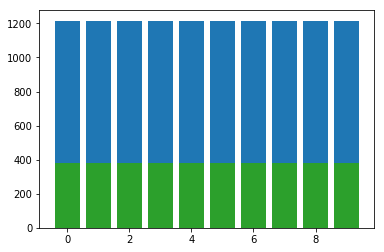

In [18]:
# Histogram for train and test 
values, count = np.unique(np.argmax(y_train, axis=1), return_counts=True)
plt.bar(values, count)

values, count = np.unique(np.argmax(y_val, axis=1), return_counts=True)
plt.bar(values, count)


values, count = np.unique(np.argmax(y_test, axis=1), return_counts=True)
plt.bar(values, count)

plt.show()

# Training

In [19]:
# Model Definition
input_shape = X_train[0].shape
num_genres = 10

model = Sequential()
# Conv Block 1
model.add(Conv2D(16, kernel_size=(3, 3), strides=(1, 1),
                 activation='relu', input_shape=input_shape))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.25))

# Conv Block 2
model.add(Conv2D(32, (3, 3), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.25))

# Conv Block 3
model.add(Conv2D(64, (3, 3), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.25))

# Conv Block 4
model.add(Conv2D(128, (3, 3), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model.add(Dropout(0.25))

# Conv Block 5
model.add(Conv2D(64, (3, 3), strides=(1, 1), activation='relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4)))
model.add(Dropout(0.25))

# MLP
model.add(Flatten())
model.add(Dense(num_genres, activation='softmax'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 126, 127, 16)      160       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 63, 63, 16)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 63, 63, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 61, 61, 32)        4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 30, 30, 32)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 30, 30, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 28, 28, 64)        18496     
__________

In [20]:
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

hist = model.fit(X_train, y_train,
          batch_size=32,
          epochs=50,
          verbose=1,
          validation_data=(X_val, y_val))

Train on 12160 samples, validate on 3040 samples
Epoch 1/50
12160/12160 [==============================] - 92s 8ms/step - loss: 2.2503 - acc: 0.2252 - val_loss: 1.9545 - val_acc: 0.2997
Epoch 2/50
12160/12160 [==============================] - 86s 7ms/step - loss: 1.7784 - acc: 0.3637 - val_loss: 1.6111 - val_acc: 0.4322
Epoch 3/50
12160/12160 [==============================] - 86s 7ms/step - loss: 1.5796 - acc: 0.4385 - val_loss: 1.5049 - val_acc: 0.4694
Epoch 4/50
12160/12160 [==============================] - 87s 7ms/step - loss: 1.4717 - acc: 0.4780 - val_loss: 1.3839 - val_acc: 0.5072
Epoch 5/50
12160/12160 [==============================] - 86s 7ms/step - loss: 1.3656 - acc: 0.5218 - val_loss: 1.2149 - val_acc: 0.6105
Epoch 6/50
12160/12160 [==============================] - 85s 7ms/step - loss: 1.3096 - acc: 0.5427 - val_loss: 1.1975 - val_acc: 0.5803
Epoch 7/50
12160/12160 [==============================] - 85s 7ms/step - loss: 1.2269 - acc: 0.5766 - val_loss: 1.1020 - val_acc:

In [21]:
score = model.evaluate(X_test, y_test, verbose=0)
print("Test_loss = {:.3f} and Test_acc = {:.3f}".format(score[0], score[1]))

Test_loss = 0.508 and Test_acc = 0.838


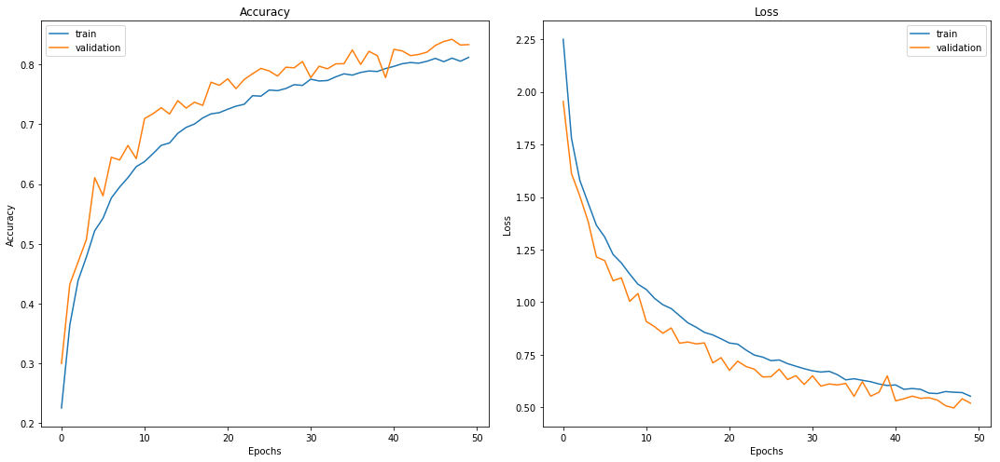

In [22]:
plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.plot(hist.history['acc'], label='train')
plt.plot(hist.history['val_acc'], label='validation')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='validation')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [23]:
#http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [24]:
preds = np.argmax(model.predict(X_test), axis = 1)
y_orig = np.argmax(y_test, axis = 1)
cm = confusion_matrix(preds, y_orig)

Normalized confusion matrix


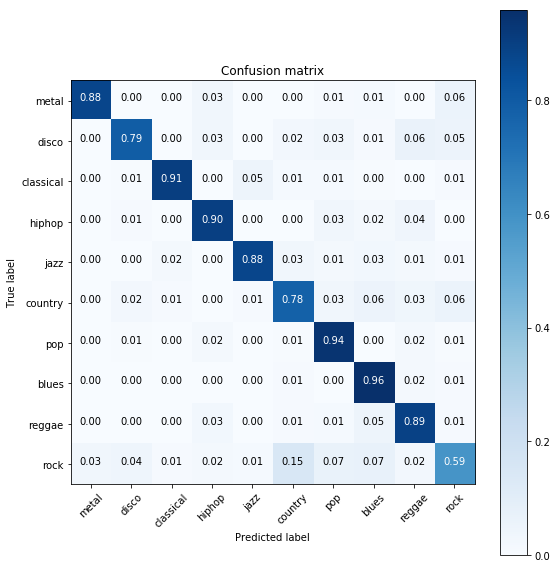

In [25]:
keys = OrderedDict(sorted(genres.items(), key=lambda t: t[1])).keys()

plt.figure(figsize=(8,8))
plot_confusion_matrix(cm, keys, normalize=True)

## Save the model

In [26]:
# Save the model
model.save('cnn.h5')

In [29]:
input_shape = X_train[0].shape
num_genres = 10

channel_axis = 3
freq_axis = 1
padding = 37

model = Sequential()
model.add(ZeroPadding2D(padding=(0, padding), data_format='channels_last', input_shape=input_shape))
model.add(BatchNormalization(axis=freq_axis, name='bn_0_freq'))

model.add(Conv2D(64, (3, 3), padding='same', name='conv1'))
model.add(BatchNormalization(axis=channel_axis, name='bn1'))
model.add(ELU())
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), name='pool1'))
model.add(Dropout(0.1, name='dropout1'))

model.add(Conv2D(128, (3, 3), padding='same', name='conv2'))
model.add(BatchNormalization(axis=channel_axis, name='bn2'))
model.add(ELU())
model.add(MaxPooling2D(pool_size=(3, 3), strides=(3, 3), name='pool2'))
model.add(Dropout(0.1, name='dropout2'))

model.add(Conv2D(128, (3, 3), padding='same', name='conv3'))
model.add(BatchNormalization(axis=channel_axis, name='bn3'))
model.add(ELU())
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), name='pool3'))
model.add(Dropout(0.1, name='dropout3'))

model.add(Conv2D(128, (3, 3), padding='same', name='conv4'))
model.add(BatchNormalization(axis=channel_axis, name='bn4'))
model.add(ELU())
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), name='pool4'))
model.add(Dropout(0.1, name='dropout4'))

model.add(Reshape(target_shape=(2, 128)))

model.add(GRU(32, return_sequences=True, name='gru1'))
model.add(GRU(32, return_sequences=False, name='gru2'))

model.add(Dropout(0.3, name='dropout_final'))

model.add(Dense(num_genres, activation='softmax', name='output'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
zero_padding2d_1 (ZeroPaddin (None, 128, 203, 1)       0         
_________________________________________________________________
bn_0_freq (BatchNormalizatio (None, 128, 203, 1)       512       
_________________________________________________________________
conv1 (Conv2D)               (None, 128, 203, 64)      640       
_________________________________________________________________
bn1 (BatchNormalization)     (None, 128, 203, 64)      256       
_________________________________________________________________
elu_1 (ELU)                  (None, 128, 203, 64)      0         
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 64, 101, 64)       0         
_________________________________________________________________
dropout1 (Dropout)           (None, 64, 101, 64)       0         
__________

In [30]:
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

hist = model.fit(X_train, y_train,
          batch_size=32,
          epochs=20,
          verbose=1,
          validation_data=(X_val, y_val))

Train on 12160 samples, validate on 3040 samples
Epoch 1/20
12160/12160 [==============================] - 1541s 127ms/step - loss: 1.7124 - acc: 0.3712 - val_loss: 1.5931 - val_acc: 0.3980
Epoch 2/20
12160/12160 [==============================] - 1512s 124ms/step - loss: 1.2532 - acc: 0.5523 - val_loss: 2.1216 - val_acc: 0.2891
Epoch 3/20
12160/12160 [==============================] - 1514s 125ms/step - loss: 1.0183 - acc: 0.6507 - val_loss: 1.5385 - val_acc: 0.4891
Epoch 4/20
12160/12160 [==============================] - 1511s 124ms/step - loss: 0.9146 - acc: 0.6951 - val_loss: 1.1731 - val_acc: 0.5993
Epoch 5/20
12160/12160 [==============================] - 1512s 124ms/step - loss: 0.8206 - acc: 0.7236 - val_loss: 1.6450 - val_acc: 0.4905
Epoch 6/20
12160/12160 [==============================] - 1513s 124ms/step - loss: 0.7399 - acc: 0.7610 - val_loss: 0.9237 - val_acc: 0.6786
Epoch 7/20
12160/12160 [==============================] - 1513s 124ms/step - loss: 0.6645 - acc: 0.7843 -

In [31]:
score = model.evaluate(X_test, y_test, verbose=0)
print("val_loss = {:.3f} and val_acc = {:.3f}".format(score[0], score[1]))

val_loss = 0.468 and val_acc = 0.860


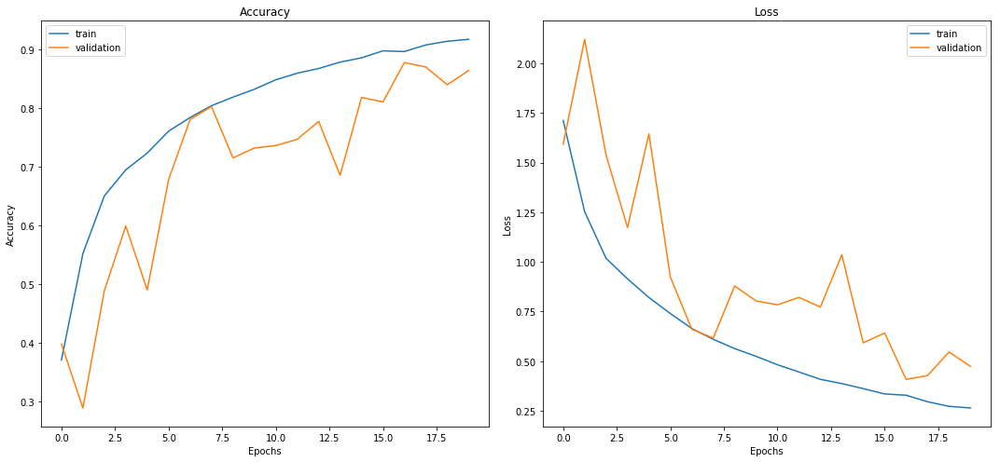

In [32]:
plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.plot(hist.history['acc'], label='train')
plt.plot(hist.history['val_acc'], label='validation')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1,2,2)
plt.plot(hist.history['loss'], label='train')
plt.plot(hist.history['val_loss'], label='validation')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [33]:
#http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [34]:
preds = np.argmax(model.predict(X_test), axis = 1)
y_orig = np.argmax(y_test, axis = 1)
cm = confusion_matrix(preds, y_orig)

Normalized confusion matrix


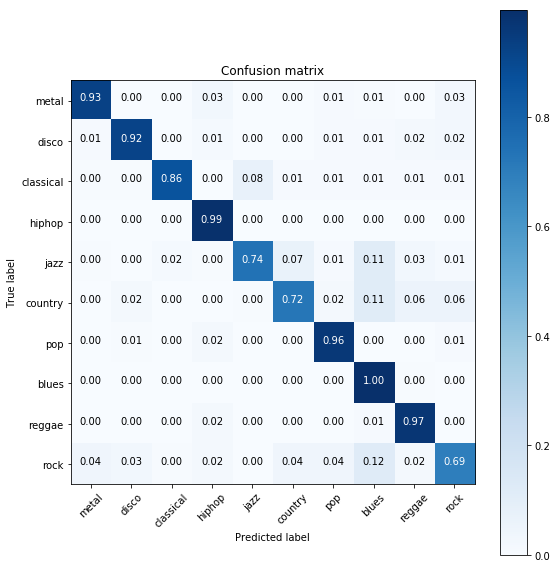

In [35]:
keys = OrderedDict(sorted(genres.items(), key=lambda t: t[1])).keys()

plt.figure(figsize=(8,8))
plot_confusion_matrix(cm, keys, normalize=True)

## Save the model

In [36]:
# Save the model
model.save('crnn.h5')

In [2]:
from keras.models import load_model
model = load_model('crnn.h5')

In [7]:
signal, sr = librosa.load("taste.mp3")

In [9]:
from IPython.display import Audio

In [11]:
Audio(signal, rate = sr)

In [74]:
debug=True
song_samples = 660000
signal, sr = librosa.load("middle.mp3", offset=30)
signal = signal[:song_samples]
                
                # Debug process
if debug:
    print("Reading file: {}".format("taste.mp3"))
                
                # Convert to dataset of spectograms/melspectograms
signals, y = splitsongs(signal, 6)
                
                # Convert to "spec" representation
specs = to_melspectrogram(signals)

arr_specs = []
arr_genres = []
                
                # Save files
arr_genres.extend(y)
arr_specs.extend(specs)
                
                
X = np.array(arr_specs)
y = np.array(arr_genres)

Reading file: taste.mp3


In [75]:
y = to_categorical(y, num_classes=10)

In [76]:
y

array([[0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.]], dtype=float32)

In [77]:
score = model.evaluate(X, y, verbose=0)
print("val_loss = {:.3f} and val_acc = {:.3f}".format(score[0], score[1]))

val_loss = 0.641 and val_acc = 0.737


In [78]:
model.predict_classes(X)

array([6, 5, 5, 6, 5, 5, 6, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6])

In [89]:
preds=model.predict(X)[8]

<BarContainer object of 10 artists>

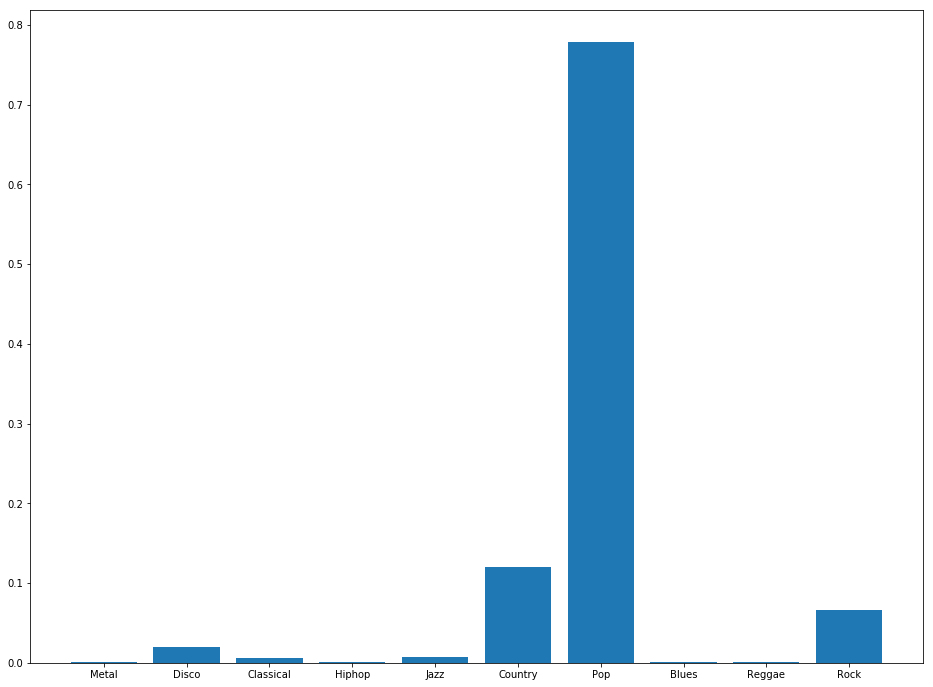

In [90]:
fig,ax=plt.subplots(figsize=(16,12))
plt.bar(x=['Metal','Disco', 'Classical', 'Hiphop', 'Jazz', 
          'Country', 'Pop', 'Blues', 'Reggae', 'Rock'], height=preds)